# Learning Functions Part 2

In this notebook we'll learn simple functions over sequences of numbers.

In [1]:
# Load environment
using Pkg
Pkg.activate("..")

"/Users/domluna/github/NeuralArithmetic/Project.toml"

In [2]:
using NeuralArithmetic
using Flux
using Plots
using DataFrames

┌ Info: Precompiling NeuralArithmetic [77cec1ae-a0aa-11e8-15c8-b1760286d022]
└ @ Base loading.jl:1186


loaded


In [3]:
# number of training set examples
N = 500

500

The dataset of a function will contain `N` training examples, 50 validation examples (interpolation), and 50 testing examples (extrapolation).

In [4]:
# N sequences of length 1 to 10
train_seqs = rand.(rand(1:10, N))
train_seqs = [float(rand(1:5, s)) for s in rand(1:10, N)]
# (interpolation) sequences longer than shown
val_seqs = [float(rand(1:5, s)) for s in rand(10:100, 50)]
# (extrapolation) sequences longer than shown + values out of range
test_seqs = [float(rand(50:100, s)) for s in rand(10:100, 50)]

50-element Array{Array{Float64,1},1}:
 [58.0, 82.0, 78.0, 82.0, 83.0, 74.0, 92.0, 68.0, 73.0, 61.0  …  92.0, 84.0, 80.0, 75.0, 53.0, 55.0, 74.0, 96.0, 82.0, 96.0]   
 [61.0, 85.0, 52.0, 59.0, 55.0, 75.0, 83.0, 73.0, 56.0, 99.0  …  68.0, 98.0, 72.0, 84.0, 87.0, 52.0, 71.0, 72.0, 77.0, 83.0]   
 [100.0, 78.0, 69.0, 93.0, 53.0, 75.0, 94.0, 89.0, 64.0, 61.0  …  64.0, 65.0, 58.0, 86.0, 64.0, 74.0, 56.0, 74.0, 94.0, 84.0]  
 [82.0, 100.0, 52.0, 71.0, 64.0, 72.0, 54.0, 57.0, 84.0, 62.0  …  81.0, 74.0, 86.0, 82.0, 77.0, 92.0, 54.0, 77.0, 62.0, 52.0]  
 [92.0, 94.0, 61.0, 91.0, 75.0, 74.0, 86.0, 87.0, 57.0, 52.0, 67.0, 57.0]                                                      
 [63.0, 72.0, 52.0, 96.0, 50.0, 77.0, 72.0, 50.0, 63.0, 91.0  …  61.0, 62.0, 88.0, 79.0, 83.0, 97.0, 94.0, 53.0, 95.0, 50.0]   
 [94.0, 73.0, 96.0, 67.0, 83.0, 55.0, 69.0, 80.0, 95.0, 78.0  …  89.0, 66.0, 79.0, 68.0, 88.0, 77.0, 54.0, 82.0, 60.0, 83.0]   
 [68.0, 60.0, 100.0, 52.0, 89.0, 66.0, 100.0, 69.0, 51.0, 96.0  … 

In [33]:
function f(m, x)
    state = m[1].(x)[end]
    # reset hidden state of recurrent node on each sequence
    Flux.reset!(m[1])
    m[2:end](state)
end

loss(m) = (x, y) -> Flux.mse(f(m, x), y)

function train_model(lossf, opt, data, epochs::Int, print_interval::Int)
    hist = zeros(epochs)
    for i in 1:epochs
        Flux.train!(lossf, data, opt)
        train_loss = Flux.data(sum(lossf(d...) for d in data[1:50]))
        if print_interval != -1 && i % print_interval == 0
            @info "Iteration $i, training loss = $train_loss"
        end
        hist[i] = train_loss
    end
    return hist
end

train_model (generic function with 1 method)

Let's run the experiments and plot results.

In [7]:
epochs = 500
print_interval = 50

50

### `+` Data

In [8]:
add_data_train = [(s, reduce(+, s)) for s in train_seqs]
add_data_val = [(s, reduce(+, s)) for s in val_seqs]
add_data_test = [(s, reduce(+, s)) for s in test_seqs];

┌ Info: Iteration 50, training loss = 3.2882753806264775
└ @ Main In[6]:7
┌ Info: Iteration 100, training loss = 1.0607582684165038
└ @ Main In[6]:7
┌ Info: Iteration 150, training loss = 0.8284797675338756
└ @ Main In[6]:7
┌ Info: Iteration 200, training loss = 0.6822587280221676
└ @ Main In[6]:7
┌ Info: Iteration 250, training loss = 0.5905914295212106
└ @ Main In[6]:7
┌ Info: Iteration 300, training loss = 0.5337296974135003
└ @ Main In[6]:7
┌ Info: Iteration 350, training loss = 0.49742844220214694
└ @ Main In[6]:7
┌ Info: Iteration 400, training loss = 0.47496129406143134
└ @ Main In[6]:7
┌ Info: Iteration 450, training loss = 0.4626638048985109
└ @ Main In[6]:7
┌ Info: Iteration 500, training loss = 0.4579129253324619
└ @ Main In[6]:7
┌ Info: ("Validation loss", 1.1875097981138763e6)
└ @ Main In[9]:5
┌ Info: ("Test loss", 9.536504777895601e8)
└ @ Main In[9]:6


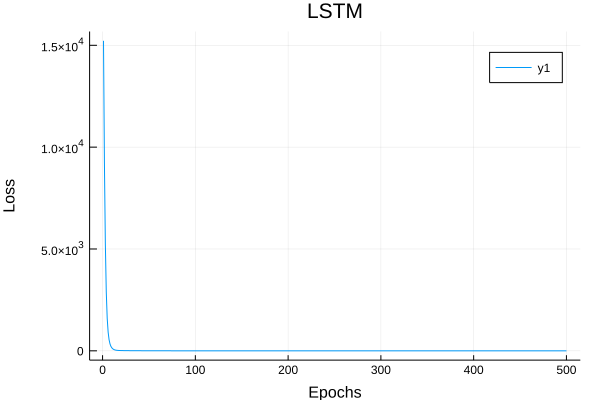

In [9]:
m = Chain(LSTM(1, 2), Dense(2, 2, relu), Dense(2, 1))
opt = ADAM(params(m))
lf = loss(m)
hist = train_model(lf, opt, add_data_train, epochs, print_interval)
@info "Validation loss", Flux.data(sum(lf(d...) for d in add_data_val))
@info "Test loss", Flux.data(sum(lf(d...) for d in add_data_test))
plot(hist, title="LSTM", xlabel="Epochs", ylabel="Loss")

┌ Info: Iteration 50, training loss = 0.8225572003103381
└ @ Main In[33]:16
┌ Info: Iteration 100, training loss = 2.0842219428021798
└ @ Main In[33]:16
┌ Info: Iteration 150, training loss = 4.070474209847619
└ @ Main In[33]:16
┌ Info: Iteration 200, training loss = 3.8320186133738363
└ @ Main In[33]:16
┌ Info: Iteration 250, training loss = 1.9212825597949057
└ @ Main In[33]:16
┌ Info: Iteration 300, training loss = 0.593874474191036
└ @ Main In[33]:16
┌ Info: Iteration 350, training loss = 0.37516826898728406
└ @ Main In[33]:16
┌ Info: Iteration 400, training loss = 0.7037986502728082
└ @ Main In[33]:16
┌ Info: Iteration 450, training loss = 2.026448772969265
└ @ Main In[33]:16
┌ Info: Iteration 500, training loss = 1.3010981477057963
└ @ Main In[33]:16
┌ Info: ("Validation loss", 25565.678309045914)
└ @ Main In[35]:5
┌ Info: ("Test loss", 1.9130493875010505e7)
└ @ Main In[35]:6


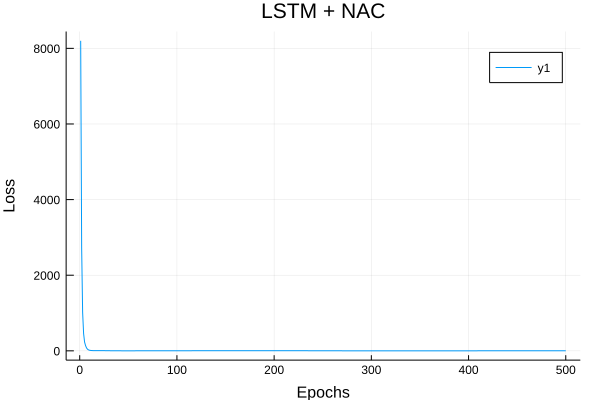

In [35]:
m = Chain(LSTM(1, 10), NAC(10, 2), Dense(2, 1))
opt = ADAM(params(m))
lf = loss(m)
hist = train_model(lf, opt, add_data_train, epochs, print_interval)
@info "Validation loss", Flux.data(sum(lf(d...) for d in add_data_val) / length(add_data_val))
@info "Test loss", Flux.data(sum(lf(d...) for d in add_data_test) / length(add_data_test))
plot(hist, title="LSTM + NAC", xlabel="Epochs", ylabel="Loss")

In [37]:
@info f(m, add_data_val[1][1][1:20]), sum(add_data_val[1][1][1:20])

┌ Info: (Flux.Tracker.TrackedReal{Float64}[38.1176 (tracked)], 63.0)
└ @ Main In[37]:1


### `*` Data

In [11]:
mul_data_train = [(s, reduce(*, s)) for s in train_seqs]
mul_data_val = [(s, reduce(*, s)) for s in val_seqs]
mul_data_test = [(s, reduce(*, s)) for s in test_seqs];

### `sqrt` Data

In [12]:
sqrt_data_train = [(s, sum(sqrt.(abs.(s)))) for s in train_seqs]
sqrt_data_val = [(s, sum(sqrt.(abs.(s)))) for s in val_seqs]
sqrt_data_test = [(s, sum(sqrt.(abs.(s)))) for s in test_seqs];